In [1]:
import asyncio # For asynchronous programming
import aiohttp # For asynchronous HTTP requests
import nest_asyncio # For allowing nested event loops
nest_asyncio.apply() # For allowing nested event loops
import json # For JSON files
from fake_useragent import UserAgent # For generating fake user agents
import random # For generating random numbers
import os # For file operations
import pandas as pd # For data manipulation

In [2]:
# Load our previously scraped dataframe (from the previous notebook)
movies_top10k_imdb_wikipedia_spoilers_df = pd.read_parquet('tmdb_top10k_imdb_wikipedia_spoilers.pq')
movies_top10k_imdb_wikipedia_spoilers_df

,wikipedia_synopsis,index,text,characters,chunks,adult,backdrop_path,belongs_to_collection,budget,genres,...,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,release_year,spoiler
640146,During her days of entrapment in the Quantum R...,tt10954600,During her days of entrapment in the Quantum R...,3025.0,3.0,False,/gMJngTNfaqCSCqGD4y8lVMZXKDn.jpg,{'backdrop_path': '/2KjtWUBiksmN8LsUouaZnxocu5...,200000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",...,125,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,Witness the beginning of a new dynasty.,Ant-Man and the Wasp: Quantumania,False,6.524,1906,2023,ANT-MAN AND THE WASP: QUANTUMANIA\n *CUT TO TH...
502356,Italian-American brothers Mario and Luigi have...,tt6718170,Italian-American brothers Mario and Luigi have...,2688.0,3.0,False,/iJQIbOPm81fPEGKt5BPuZmfnA54.jpg,None,100000000,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",...,92,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,The Super Mario Bros. Movie,False,7.517,1483,2023,THE SUPER MARIO BROS. MOVIE\n *CUT TO THE CHAS...
594767,"Two years after Thaddeus Sivana's defeat, Hesp...",tt10151854,"Several years after the defeat of Dr. Sivana, ...",14364.0,12.0,False,/wybmSmviUXxlBmX44gtpow5Y9TB.jpg,{'backdrop_path': '/qHvTysanNatrEQECO36iES7U1z...,125000000,"[{'id': 28, 'name': 'Action'}, {'id': 35, 'nam...",...,130,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,Oh. My. Gods.,Shazam! Fury of the Gods,False,6.860,1253,2023,SHAZAM! Fury of the Gods\n *CUT TO THE CHASE*\...
76600,Sixteen years after the Na'vi repelled the RDA...,tt1630029,Over a decade after the events of the first fi...,7104.0,6.0,False,/ovM06PdF3M8wvKb06i4sjW3xoww.jpg,{'backdrop_path': '/iaEsDbQPE45hQU2EGiNjXD2KWu...,350000000,"[{'id': 878, 'name': 'Science Fiction'}, {'id'...",...,192,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,Return to Pandora.,Avatar: The Way of Water,False,7.720,7556,2022,AVATAR: The Way of Water\n *CUT TO THE CHASE*\...
948713,"Anlaf, a Viking king from Irland, arrives with...",tt15767808,"Anlaf, a Viking king from Ireland, arrives wit...",4375.0,4.0,False,/xwA90BwZXTh8ke3CVsQlj8EOkFr.jpg,None,0,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",...,111,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,The Last Kingdom: Seven Kings Must Die,False,7.382,234,2023,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
329829,None,tt1254322,"At age six in 1632 upon his death, Kristina, t...",1545.0,2.0,False,/27GTXoyC8PN2INga6zCAZP1TkJm.jpg,None,0,"[{'id': 18, 'name': 'Drama'}, {'id': 36, 'name...",...,106,"[{'english_name': 'German', 'iso_639_1': 'de',...",Released,,The Girl King,False,6.300,151,2015,
74658,None,tt1618450,The King and Queen of Sparks and Bloom's biolo...,182.0,1.0,False,/apedEXmc9wSiphdi7JenkB8hCJR.jpg,{'backdrop_path': '/nt2ArMVA14yvfvBdWfp0txK2jw...,35000000,"[{'id': 16, 'name': 'Animation'}, {'id': 10751...",...,87,"[{'english_name': 'Dutch', 'iso_639_1': 'nl', ...",Released,,Winx Club - Magic Adventure,False,6.900,100,2010,
408509,None,tt4746516,Four different instances in the life of the sa...,1426.0,2.0,False,/1MIs5fcBZ2F8f2tK98L6DxYtP4v.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",...,111,"[{'english_name': 'French', 'iso_639_1': 'fr',...",Released,,Orphan,False,5.280,82,2017,
334354,None,tt3849938,It is the summer holiday and Mika once again h...,1077.0,1.0,False,/fPjsLSiD8iXhLX3PaR8USs5Cxkh.jpg,{'backdrop_path': '/1UtU6fn5DH2aEdD8b5M4m5ZBvd...,0,"[{'id': 12, 'name': 'Adventure'}, {'id': 18, '...",...,103,"[{'english_name': 'German', 'iso_639_1': 'de',...",Released,,Windstorm 2,False,7.401,191,2015,


In [3]:
base_path = 'https://image.tmdb.org/t/p/w600_and_h900_bestv2/'
id_poster_path = pd.DataFrame({idx: os.path.join(base_path,url[0].split('/')[-1]) for idx,url in movies_top10k_imdb_wikipedia_spoilers_df[['poster_path']].dropna().iterrows()},index=['path']).T
id_poster_path['savename'] = [str(idx) + "__" + os.path.split(url)[-1].split('.')[0] + '.' + os.path.split(url)[-1].split('.')[-1]  for url,idx in zip(id_poster_path['path'],id_poster_path.index)]
id_poster_path

,path,savename
640146,https://image.tmdb.org/t/p/w600_and_h900_bestv...,640146__ngl2FKBlU4fhbdsrtdom9LVLBXw.jpg
502356,https://image.tmdb.org/t/p/w600_and_h900_bestv...,502356__qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg
594767,https://image.tmdb.org/t/p/w600_and_h900_bestv...,594767__2VK4d3mqqTc7LVZLnLPeRiPaJ71.jpg
76600,https://image.tmdb.org/t/p/w600_and_h900_bestv...,76600__t6HIqrRAclMCA60NsSmeqe9RmNV.jpg
948713,https://image.tmdb.org/t/p/w600_and_h900_bestv...,948713__7yyFEsuaLGTPul5UkHc5BhXnQ0k.jpg
...,...,...
329829,https://image.tmdb.org/t/p/w600_and_h900_bestv...,329829__vJ1UYKX3NTy48YHqMkqLJwu5jt.jpg
74658,https://image.tmdb.org/t/p/w600_and_h900_bestv...,74658__cCo7LiUtcwWgcSbVHk2jur4K6pV.jpg
408509,https://image.tmdb.org/t/p/w600_and_h900_bestv...,408509__7eh988sXWDPdhbOf7dhiHTVcC6e.jpg
334354,https://image.tmdb.org/t/p/w600_and_h900_bestv...,334354__aHGggpUWE1CpIAWDL82t9bij5qv.jpg


In [59]:
# Function to download an image for a given URL
async def download_image(session, url, file_name):
    save_path = os.path.join("tmdb_posters", file_name)

    if os.path.exists(save_path):
        print(f"Image {file_name} already exists. Skipping...")
        return

    headers = {"User-Agent": UserAgent().random}

    async with session.get(url, headers=headers) as response:
        if response.status == 200:
            content = await response.read()
            with open(save_path, 'wb') as file:
                file.write(content)
            print(f"Downloaded image {file_name}")
        else:
            print(f"Error downloading image from {url}: {response.status}")

async def main():
    output_folder = "tmdb_posters"

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    rate_limit = 5
    delay_between_calls = 1 / rate_limit
    random_delay_variance = 0.1

    async with aiohttp.ClientSession() as session:
        for idx,row in id_poster_path.iterrows():
            await download_image(session, row.path, row.savename)
            await asyncio.sleep(delay_between_calls + random.uniform(-random_delay_variance, random_delay_variance))

In [60]:
if __name__ == "__main__":
    loop = asyncio.get_event_loop()
    await main()

Downloaded image 640146__ngl2FKBlU4fhbdsrtdom9LVLBXw.jpg
Downloaded image 502356__qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg
Downloaded image 594767__2VK4d3mqqTc7LVZLnLPeRiPaJ71.jpg
Downloaded image 76600__t6HIqrRAclMCA60NsSmeqe9RmNV.jpg
Downloaded image 948713__7yyFEsuaLGTPul5UkHc5BhXnQ0k.jpg
Downloaded image 677179__cvsXj3I9Q2iyyIo95AecSd1tad7.jpg
Downloaded image 638974__s1VzVhXlqsevi8zeCMG9A16nEUf.jpg
Downloaded image 713704__mIBCtPvKZQlxubxKMeViO2UrP3q.jpg
Downloaded image 1048300__qVzRt8c2v4gGBYsnaflXVVeQ9Lh.jpg
Downloaded image 315162__kuf6dutpsT0vSVehic3EZIqkOBt.jpg
Downloaded image 603692__vZloFAK7NmvMGKE7VkF5UHaz0I.jpg
Downloaded image 804150__gOnmaxHo0412UVr1QM5Nekv1xPi.jpg
Downloaded image 700391__rzRb63TldOKdKydCvWJM8B6EkPM.jpg
Downloaded image 758323__9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg
Downloaded image 842945__gbGHezV6yrhua0KfAgwrknSOiIY.jpg
Downloaded image 1033219__qNz4l8UgTkD8rlqiKZ556pCJ9iO.jpg
Downloaded image 868759__liLN69YgoovHVgmlHJ876PKi5Yi.jpg
Downloaded image 934433__wDWwtv

In [4]:
import glob

In [5]:
# Grab all the pictures in the folder
posters = glob.glob('tmdb_posters/*')

In [39]:
import torch
import torchvision.transforms as T

# Get the latest DINOV2 model from Facebook
dinov2_vitg14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14') # large model

# Preprocess the images
image_transforms = T.Compose([
    T.Resize(256, interpolation=T.InterpolationMode.BICUBIC),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])

Using cache found in /Users/mdrk/.cache/torch/hub/facebookresearch_dinov2_main
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /Users/mdrk/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth
100%|██████████| 1.13G/1.13G [00:59<00:00, 20.6MB/s]


In [40]:
from PIL import Image
import tqdm.notebook as tqdm

# Compute all the embeddings
embeddings_re = []
for image in tqdm.tqdm(posters):
    image = Image.open(image)
    image = image.convert(mode='RGB') # Edge case for black and white images with only 1 channel
    
    t_img = image_transforms(image)
    dino_emb = dinov2_vitg14(t_img.unsqueeze(0))
    embeddings_re.append(dino_emb.cpu().detach().numpy())


  0%|          | 0/9795 [00:00<?, ?it/s]

In [41]:
# Make a paranoia copy
embeddings = embeddings_re.copy()

In [56]:
# Simply a new dataframe
posters_df = pd.DataFrame({'poster_path':posters},index=[int(os.path.split(a)[-1].split("__")[0]) for a in posters])
posters_df

,poster_path
454467,tmdb_posters/454467__2zHGNWo4vrAzB5ZqQC0e3p4A2...
58428,tmdb_posters/58428__yxO4uUhtBw9Y3ChywfGrxKBXpI...
4643,tmdb_posters/4643__iFOw9bXeLM6a2WbI7T1ytF8o0Wn...
446696,tmdb_posters/446696__pE2hxC8bPbIi9tGyhFg5xiFW6...
75780,tmdb_posters/75780__uQBbjrLVsUibWxNDGA4Czzo8lw...
...,...
174321,tmdb_posters/174321__mF14chZNzgDRZffs8Wk8lPwdN...
916605,tmdb_posters/916605__bSqpOGzaKBdGkBLmcm1JJIVry...
1061671,tmdb_posters/1061671__aOj8mNRXz3ss9pwCYgpva1Jq...
802217,tmdb_posters/802217__5YwaISdOwp8Zu6O7kwBeUn8a7...


In [62]:
import numpy as np
from torch import nn

# Simple helper function
# Function to compute similarity for a given TMDB ID
# No error checking: YOLOing
def computeSimilarity(embeddings, index):
    # normalize features
    train_features = nn.functional.normalize(torch.tensor(np.stack(embeddings)).squeeze(), dim=1, p=2)
    query_features = nn.functional.normalize(torch.tensor(np.stack(embeddings).squeeze()[np.where(posters_df.index == index)[0][0]:(np.where(posters_df.index == index)[0][0]+1)]), dim=1, p=2)
    # compute similarity
    sim = torch.mm(train_features, query_features.T)
    ranks = torch.argsort(-sim, dim=0).cpu().numpy()

    return pd.DataFrame({'posters': posters_df.poster_path, 'sim': sim.cpu().numpy().flatten()},index=posters_df.index).sort_values('sim', ascending=False)


In [64]:
top25_df = computeSimilarity(embeddings, 640146).head(25)
top25_df

,posters,sim
640146,tmdb_posters/640146__ngl2FKBlU4fhbdsrtdom9LVLB...,1.000000
242643,tmdb_posters/242643__mmQZekxr9gJ7c0Grkx6xgKvrp...,0.824463
14609,tmdb_posters/14609__fKQqZEDmvKMCXEQztvMJHGou9d...,0.824111
305470,tmdb_posters/305470__iRAZIEgfB9N0BObV0QI61Nxh9...,0.822498
299534,tmdb_posters/299534__or06FN3Dka5tukK1e9sl16pB3...,0.820662
99861,tmdb_posters/99861__4ssDuvEDkSArWEdyBl2X5EHvYK...,0.819724
379291,tmdb_posters/379291__ctHGhbe19xIX6wlECsFydHiha...,0.813194
10138,tmdb_posters/10138__6WBeq4fCfn7AN0o21W9qNcRF2l...,0.811149
886396,tmdb_posters/886396__mvffaexT5kA3chOnGxwBSlRos...,0.806836
30061,tmdb_posters/30061__5Cjrxbv0BIxzgKFC9PYcgmPtnM...,0.806621


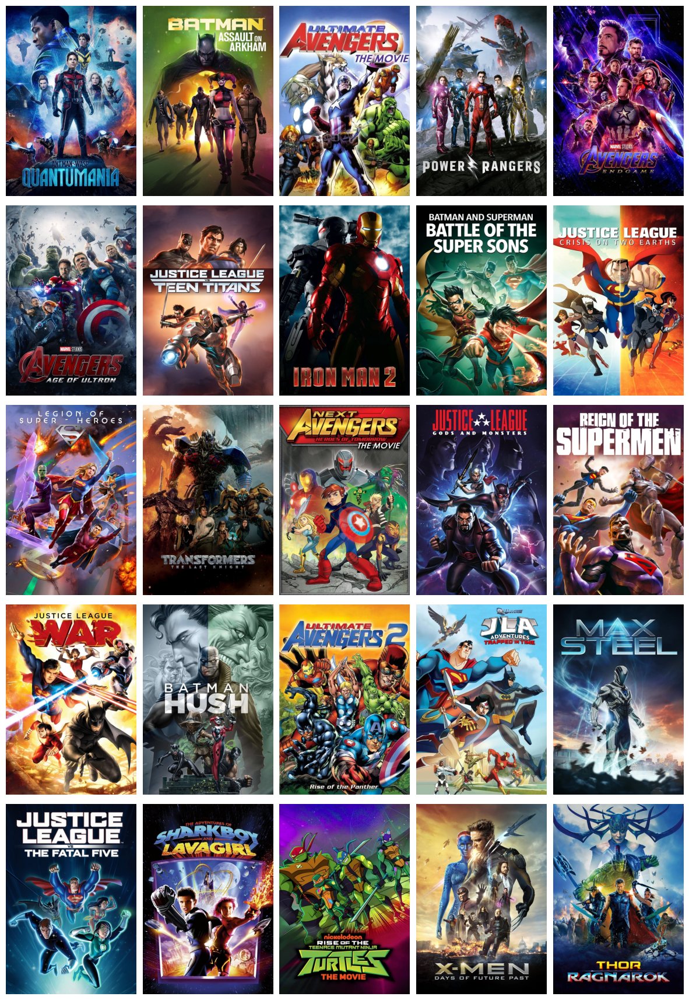

In [65]:
import matplotlib.pyplot as plt
max_rows = 5
max_cols = 5
fig, axes = plt.subplots(nrows=max_rows, ncols=max_cols, figsize=(15,22))
for idx, image in enumerate(top25_df.posters.tolist()):
    image = np.array(Image.open(image))
    row = idx // max_cols
    col = idx % max_cols
    axes[row, col].axis("off")
    axes[row, col].imshow(image, cmap="gray", aspect="auto")

plt.subplots_adjust(wspace=.05, hspace=.05)
plt.show()

In [66]:
top25_df = computeSimilarity(embeddings, 502356).head(25)
top25_df

,posters,sim
502356,tmdb_posters/502356__qNBAXBIQlnOThrVvA6mA2B5gg...,1.000000
14248,tmdb_posters/14248__mI4SPs0bZQm7bGVZKToC8KUsTd...,0.737841
864388,tmdb_posters/864388__8j9iIwxFal1Nq8NY4MSLC6Y6b...,0.712522
675353,tmdb_posters/675353__6DrHO1jr3qVrViUO6s6kFiAGM...,0.710497
36736,tmdb_posters/36736__gVQYBtUXC8GUQZx6RxigC3Hlea...,0.698720
24662,tmdb_posters/24662__5Fq3lsn398I5djODa3v8fQW9ss...,0.696624
12589,tmdb_posters/12589__pUwdquA6Bf3Gq8yT5iQL1Yq0jk...,0.692817
552095,tmdb_posters/552095__h09VT8gNfRBlr7S8l1lm27m4r...,0.692063
808,tmdb_posters/808__iB64vpL3dIObOtMZgX3RqdVdQDc.jpg,0.686043
627661,tmdb_posters/627661__maBFNvaxae6IgLL4qwz7hvz19...,0.678255


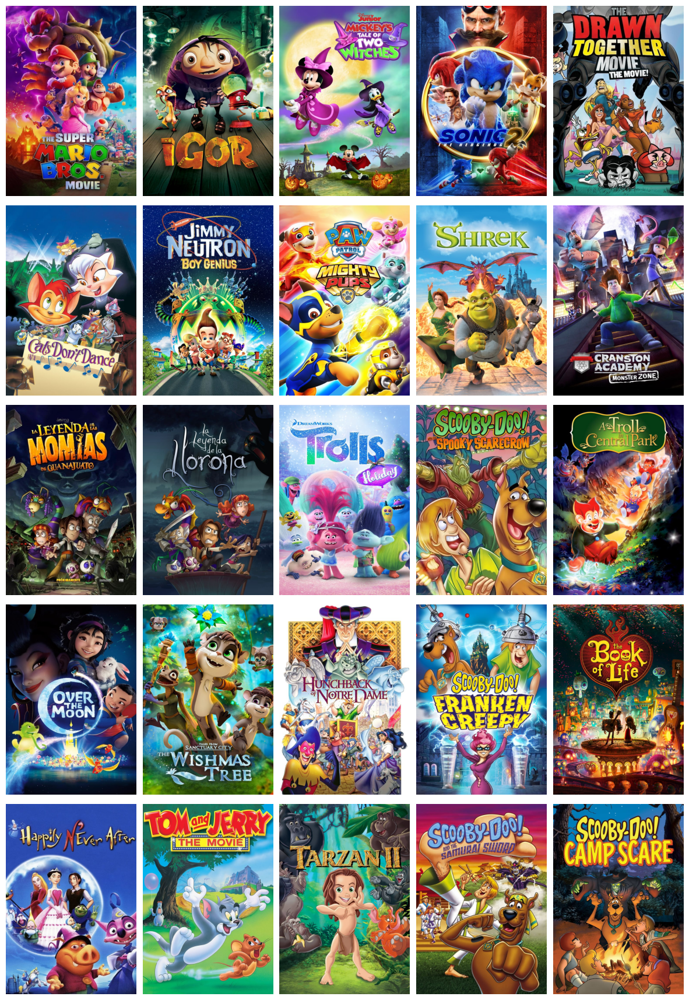

In [67]:
import matplotlib.pyplot as plt
max_rows = 5
max_cols = 5
fig, axes = plt.subplots(nrows=max_rows, ncols=max_cols, figsize=(15,22))
for idx, image in enumerate(top25_df.posters.tolist()):
    image = np.array(Image.open(image))
    row = idx // max_cols
    col = idx % max_cols
    axes[row, col].axis("off")
    axes[row, col].imshow(image, cmap="gray", aspect="auto")

plt.subplots_adjust(wspace=.05, hspace=.05)
plt.show()

In [72]:
top25_df = computeSimilarity(embeddings, 238).head(25)
top25_df

,posters,sim
238,tmdb_posters/238__3bhkrj58Vtu7enYsRolD1fZdja1.jpg,1.000000
240,tmdb_posters/240__hek3koDUyRQk7FIhPXsa6mT2Zc3.jpg,0.403559
10552,tmdb_posters/10552__kKyq7izpMkmr8sT2nLic5qAuJP...,0.346641
1008204,tmdb_posters/1008204__5TFbrqLvB6eCXSbe208SUVzA...,0.341206
27431,tmdb_posters/27431__eTIQgrQcwdR9PS2jOCGnUHg4xW...,0.333836
462650,tmdb_posters/462650__7oaCHEtTsPaFtL9rvlRbbiiz1...,0.329993
10562,tmdb_posters/10562__rAu7CA2qLTaXZd0fHVeNI2NB5W...,0.326175
202575,tmdb_posters/202575__3R13g2XgblynIrQGF8geFZJPN...,0.321518
342521,tmdb_posters/342521__dPWlBmCixh9k3Jjb7c7jkIaxB...,0.317536
73873,tmdb_posters/73873__68fdlvmqTWGC2y5nGXQE5RfgNB...,0.316079


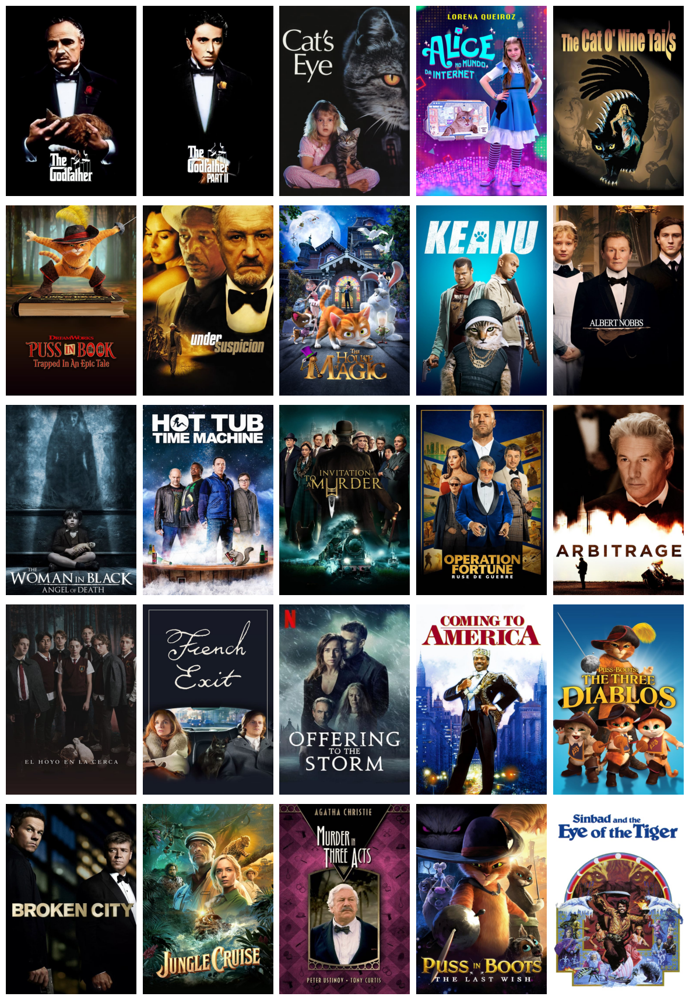

In [71]:
import matplotlib.pyplot as plt
max_rows = 5
max_cols = 5
fig, axes = plt.subplots(nrows=max_rows, ncols=max_cols, figsize=(15,22))
for idx, image in enumerate(top25_df.posters.tolist()):
    image = np.array(Image.open(image))
    row = idx // max_cols
    col = idx % max_cols
    axes[row, col].axis("off")
    axes[row, col].imshow(image, cmap="gray", aspect="auto")

plt.subplots_adjust(wspace=.05, hspace=.05)
plt.show()

In [73]:
top25_df = computeSimilarity(embeddings, 155).head(25)
top25_df

,posters,sim
155,tmdb_posters/155__qJ2tW6WMUDux911r6m7haRef0WH.jpg,1.000000
49026,tmdb_posters/49026__85cWkCVftiVs0BVey6pxX8uNmL...,0.841333
2661,tmdb_posters/2661__zzoPxWHnPa0eyfkMLgwbNvdEcVF...,0.720267
630656,tmdb_posters/630656__qdEhhPYsfIeWSNTfzHShHOkDf...,0.718012
242643,tmdb_posters/242643__mmQZekxr9gJ7c0Grkx6xgKvrp...,0.713241
183011,tmdb_posters/183011__ek9SvmkUfh5QwRGIfK0il4Dfn...,0.703873
11244,tmdb_posters/11244__yU4iGGvG51mHj8MOQICdw6ABXz...,0.697027
123025,tmdb_posters/123025__kkjTbwV1Xnj8wBL52PjOcXzTb...,0.696167
24428,tmdb_posters/24428__RYMX2wcKCBAr24UyPD7xwmjaTn...,0.696096
397852,tmdb_posters/397852__9TTRFp7OpMEv3xDuUAU4m5d6t...,0.687091


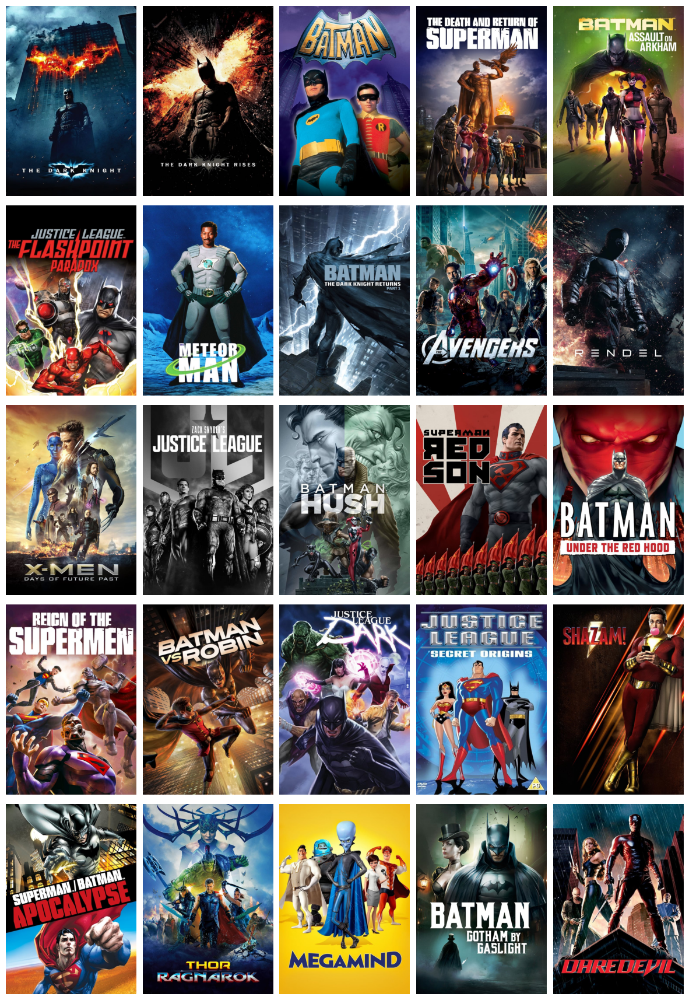

In [74]:
import matplotlib.pyplot as plt
max_rows = 5
max_cols = 5
fig, axes = plt.subplots(nrows=max_rows, ncols=max_cols, figsize=(15,22))
for idx, image in enumerate(top25_df.posters.tolist()):
    image = np.array(Image.open(image))
    row = idx // max_cols
    col = idx % max_cols
    axes[row, col].axis("off")
    axes[row, col].imshow(image, cmap="gray", aspect="auto")

plt.subplots_adjust(wspace=.05, hspace=.05)
plt.show()

In [75]:
# Save to disk
np.savez_compressed(f'preprocessing/embeddings__posters__dino-vitl16.npz', embedding=np.stack(embeddings).squeeze().astype(np.float32))